In [3]:
!pip install lime scikit-learn matplotlib pandas numpy seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=e0ed41ac592a2c78091df2ded2543170346c7ad6b7d650f1786495351da8d2e0
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [4]:
## Part 1: Import all the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_breast_cancer, load_wine
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from lime import lime_tabular

In [5]:
## Part 2: Loading and Preparing the Datasets


# Load the Breast Cancer dataset
cancer = load_breast_cancer()
X_cancer = pd.DataFrame(cancer.data, columns=cancer.feature_names)
y_cancer = cancer.target

# Load the Wine dataset
wine = load_wine()
X_wine = pd.DataFrame(wine.data, columns=wine.feature_names)
y_wine = wine.target

# Display dataset information
print("Breast Cancer Dataset Information:")
X_cancer.info()
X_cancer.describe()

print("\nWine Dataset Information:")
X_wine.info()
X_wine.describe()

# Split the datasets into training and testing sets
X_train_cancer, X_test_cancer, y_train_cancer, y_test_cancer = train_test_split(X_cancer, y_cancer, test_size=0.2, random_state=42)
X_train_wine, X_test_wine, y_train_wine, y_test_wine = train_test_split(X_wine, y_wine, test_size=0.2, random_state=42)

Breast Cancer Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    floa

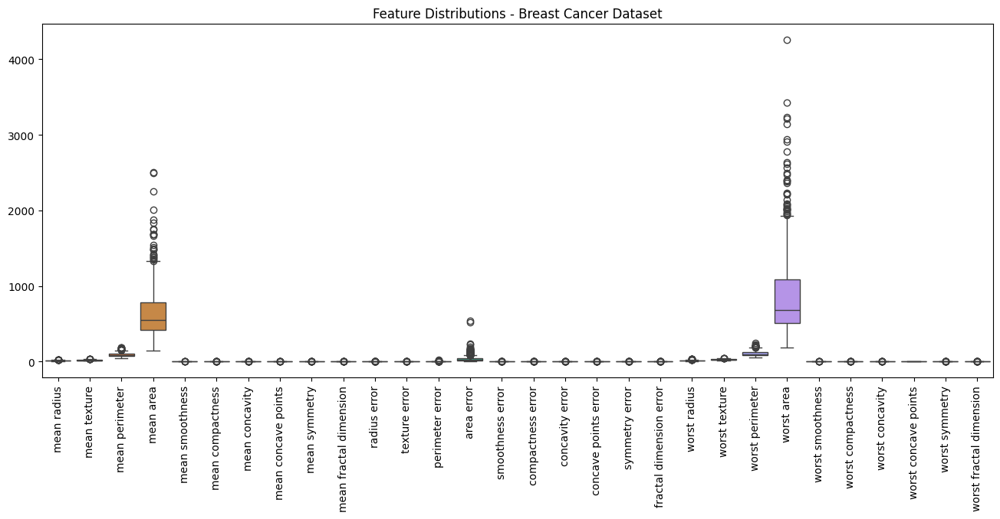

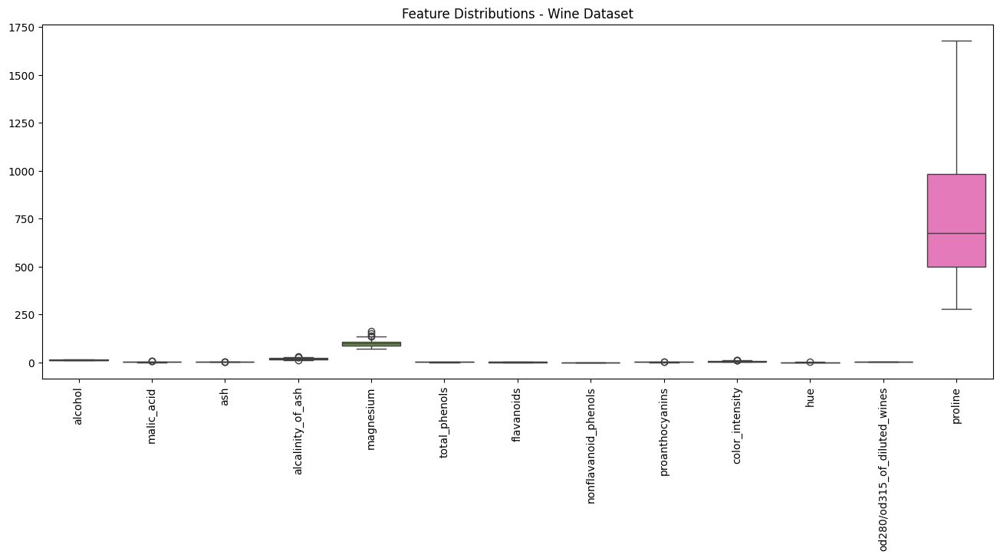

In [6]:
# Visualize distributions of features
plt.figure(figsize=(16, 6))
sns.boxplot(data=X_cancer)
plt.title('Feature Distributions - Breast Cancer Dataset')
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(16, 6))
sns.boxplot(data=X_wine)
plt.title('Feature Distributions - Wine Dataset')
plt.xticks(rotation=90)
plt.show()

Training on Breast Cancer Dataset:
Logistic Regression: (Breast Cancer) Test Accuracy: 95.61%
Random Forest: (Breast Cancer) Test Accuracy: 96.49%
Support Vector Machine: (Breast Cancer) Test Accuracy: 94.74%
K-Nearest Neighbors: (Breast Cancer) Test Accuracy: 95.61%

Training on Wine Dataset:
Logistic Regression: (Wine) Test Accuracy: 100.00%
Random Forest: (Wine) Test Accuracy: 100.00%
Support Vector Machine: (Wine) Test Accuracy: 80.56%
K-Nearest Neighbors: (Wine) Test Accuracy: 72.22%


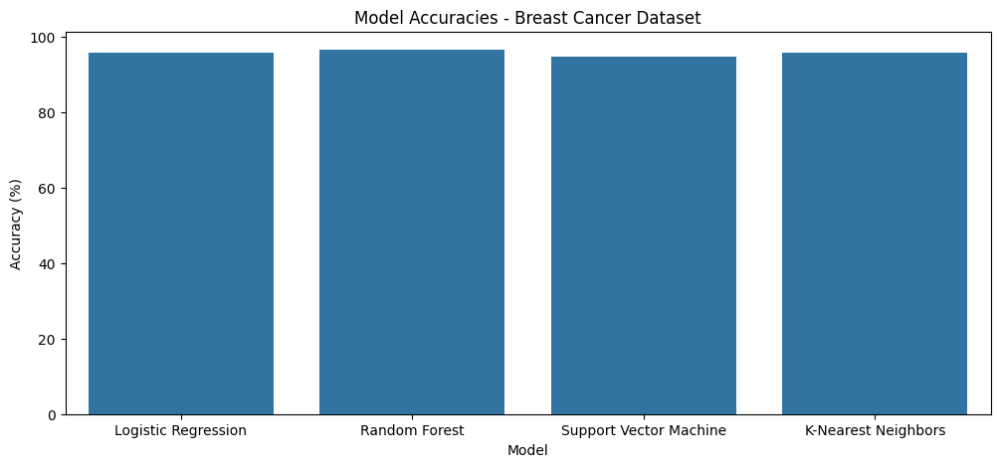

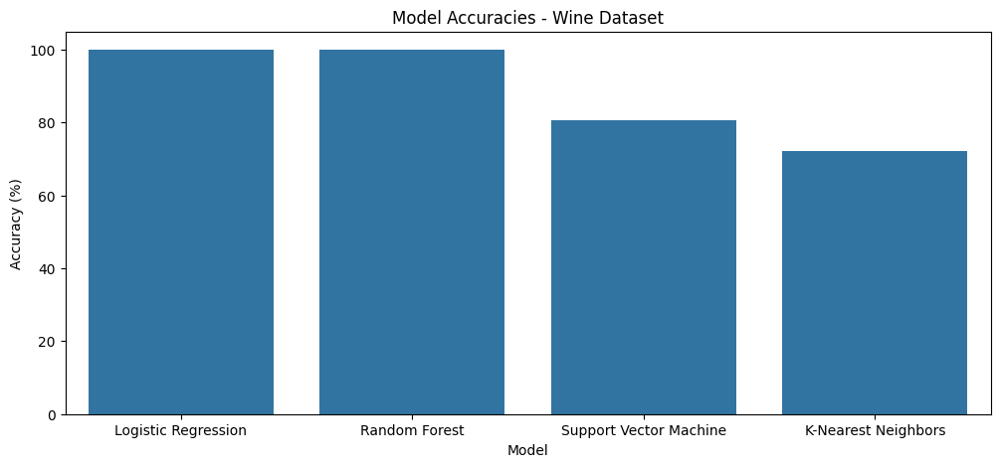

In [8]:
## Part 3: Training Multiple Machine Learning Models

models_cancer = {
    'Logistic Regression': LogisticRegression(max_iter=10000, random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Support Vector Machine': SVC(probability=True, random_state=42),
    'K-Nearest Neighbors': KNeighborsClassifier(n_neighbors=5)
}

models_wine = {
    'Logistic Regression': LogisticRegression(max_iter=10000, random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Support Vector Machine': SVC(probability=True, random_state=42),
    'K-Nearest Neighbors': KNeighborsClassifier(n_neighbors=5)
}

trained_models_cancer = {}
trained_models_wine = {}

cancer_accuracies = {}
wine_accuracies = {}

print("Training on Breast Cancer Dataset:")
for name, model in models_cancer.items():
    model.fit(X_train_cancer, y_train_cancer)
    accuracy = model.score(X_test_cancer, y_test_cancer)
    trained_models_cancer[name] = model
    cancer_accuracies[name] = accuracy * 100
    print(f"{name}: (Breast Cancer) Test Accuracy: {accuracy * 100:.2f}%")

print("\nTraining on Wine Dataset:")
for name, model in models_wine.items():
    model.fit(X_train_wine, y_train_wine)
    accuracy = model.score(X_test_wine, y_test_wine)
    trained_models_wine[name] = model
    wine_accuracies[name] = accuracy * 100
    print(f"{name}: (Wine) Test Accuracy: {accuracy * 100:.2f}%")

# Plot model accuracies for both datasets
plt.figure(figsize=(12, 5))
sns.barplot(x=list(cancer_accuracies.keys()), y=list(cancer_accuracies.values()))
plt.title('Model Accuracies - Breast Cancer Dataset')
plt.xlabel('Model')
plt.ylabel('Accuracy (%)')
plt.show()

plt.figure(figsize=(12, 5))
sns.barplot(x=list(wine_accuracies.keys()), y=list(wine_accuracies.values()))
plt.title('Model Accuracies - Wine Dataset')
plt.xlabel('Model')
plt.ylabel('Accuracy (%)')
plt.show()

In [ ]:
## Part 4: Applying LIME for Model Interpretation



In [9]:
# Initialize LIME Explainers for both datasets
explainer_cancer = lime_tabular.LimeTabularExplainer(
    X_train_cancer.values,
    feature_names=X_cancer.columns,
    class_names=cancer.target_names,
    discretize_continuous=True)

explainer_wine = lime_tabular.LimeTabularExplainer(
    X_train_wine.values,
    feature_names=X_wine.columns,
    class_names=wine.target_names,
    discretize_continuous=True)

# Select an instance from each test set to explain
instance_cancer = X_test_cancer.iloc[0].values.reshape(1, -1)
instance_wine = X_test_wine.iloc[0].values.reshape(1, -1)

print("LIME Explanation for Breast Cancer Dataset:")
for name, model in trained_models_cancer.items():
    explanation = explainer_cancer.explain_instance(instance_cancer.flatten(), model.predict_proba, num_features=5)
    explanation.show_in_notebook()

print("LIME Explanation for Wine Dataset:")
for name, model in trained_models_wine.items():
    explanation = explainer_wine.explain_instance(instance_wine.flatten(), model.predict_proba, num_features=5)
    explanation.show_in_notebook()

LIME Explanation for Breast Cancer Dataset:


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


LIME Explanation for Wine Dataset:


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
